In [1]:
from main import *
from useful_functions import *
from visualization import *

import bct
import hdbscan
from sklearn.manifold import TSNE

%matplotlib inline
plt.rcParams['font.size'] = 6

# Important refs

- 2024: https://www.nature.com/articles/s42003-024-05766-w
- 2021: https://direct.mit.edu/netn/article/5/2/405/97538/Dynamic-expression-of-brain-functional-systems
- 2021: https://www.pnas.org/doi/abs/10.1073/pnas.2109380118

#### To-do list

- Compute RMS to find peaks of activity.
- Compute hierarchical clustering of states and find number of clusters based on statistical criterion.
- Determine if coactivation patterns are significantly modular.

# Setting paths

In [2]:
top_directory = '/media/anleg84/Backup Plus/CERVO/Data/Networks2024/'
atlas_path = '/home/anleg84/Documents/Atlas/Mapzebrain/'

In [3]:
atlas = MapzebrainAtlas(atlas_path)
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]

In [4]:
datasets = get_datasets(top_directory, keywords=['920nm'], exclude=[])
print(len(datasets))

22


In [5]:
W_dir = np.load('Results/directed_terminals_expanded.npy')
W_und = np.load('Results/undirected_terminals_expanded.npy')
FC = np.load('Results/FC_matrix.npy')

In [6]:
delete = delete_rows_and_columns

# Computing bilateral regional time series

In [7]:
compute = False

if compute:
    for folder in tqdm(datasets, file=sys.stdout):
        
        data = load_data(folder)
        dff = np.load(folder + 'dff.npy')
        left = data['centroids_atlas'][:, 0] <= 284
        right = data['centroids_atlas'][:, 0] > 284
        region_series = np.zeros((140, dff.shape[1]))
        for i in range(70):
            in_region = data['region_labels'][:, i] != 0
            if np.any(in_region & left):
                region_series[i] = np.mean(dff[in_region & left], axis=0)
            if np.any(in_region & right):
                region_series[i + 70] = np.mean(dff[in_region & right], axis=0)
    
        np.save(folder + 'region_series_dff_bilateral.npy', region_series)

# Loading bilateral time series and excluding regions

In [8]:
from scipy.stats import zscore

In [9]:
sigma = 2
remove_global = False

rseries = []
for ds in datasets:
    rseries.append(np.load(ds + 'region_series_dff_bilateral.npy')[:, :])
    for i in range(rseries[-1].shape[0]):
        rseries[-1][i] = gaussian_filter1d(rseries[-1][i], sigma)

if rseries[-1].shape[0] == 140:
    excluded = np.unique(np.where(np.sum((np.sum(np.stack(rseries, axis=0), axis=2) == 0), axis=0) != 0)[0] % 70)
    excluded = np.unique(np.concatenate([[10], excluded]))
    excluded = np.concatenate([excluded, excluded + 70])
else:
    excluded = np.unique(np.where(np.sum((np.sum(np.stack(rseries, axis=0), axis=2) == 0), axis=0) != 0)[0] % 70)
    excluded = np.unique(np.concatenate([[10], excluded]))
    #excluded = np.concatenate([excluded, excluded + 70])

for i in range(len(rseries)):
    rseries[i] = np.delete(rseries[i], excluded, axis=0)

for i in range(len(rseries)):
    dff = compute_dff_using_minfilter(rseries[i],
                                          window=30,
                                          sigma1=3,
                                          sigma2=30)
    if remove_global:
        dff = remove_global_signal(dff)
    rseries[i] = zscore(dff, axis=1)

# State matrix

In [10]:
state_matrix = np.concatenate(rseries, axis=1)
R = state_matrix.shape[0]

save = False
if save:
    np.save('Results/regional_state_matrix.npy', state_matrix)

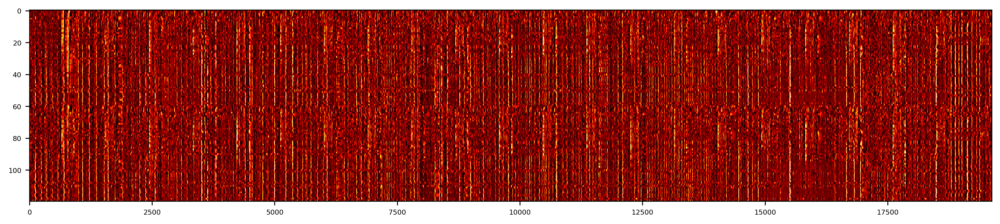

In [11]:
plt.figure(figsize=(15, 3), dpi=300)
plt.imshow(state_matrix, cmap='hot', aspect='auto', vmin=-1, vmax=4)

In [12]:
def compute_RMS(timeseries):
    R = timeseries.shape[0]
    RMS = []
    for i in range(timeseries.shape[1]):
        c = timeseries[:, i]
        coactivation = c.reshape(R, 1) @ c.reshape(1, R)
        RMS.append(np.sqrt(np.mean(coactivation[np.triu_indices(R, 1)] ** 2)))
    return np.array(RMS)

In [13]:
RMS = compute_RMS(state_matrix)

In [14]:
compute = False

if compute:
    null_RMS_values = []
    for _ in tqdm(range(100), file=sys.stdout):
        permuted_rseries = []
        for ts in rseries:
            permuted_rseries.append(permute_timeseries(ts))
        null_state_matrix = np.concatenate(permuted_rseries, axis=1)
        null_RMS = compute_RMS(null_state_matrix)
        null_RMS_values.append(null_RMS)
    null_RMS = np.concatenate(null_RMS_values)
    np.save('Results/figure4_null_RMS_dist.npy', np.concatenate(null_RMS_values))
else:
    null_RMS_values = np.load('Results/figure4_null_RMS_dist.npy')

In [15]:
null_RMS_threshold = [np.percentile(null_RMS_values, 95)] * state_matrix.shape[1]
np.save('Results/figure4_RMS_threshold.npy', null_RMS_threshold)

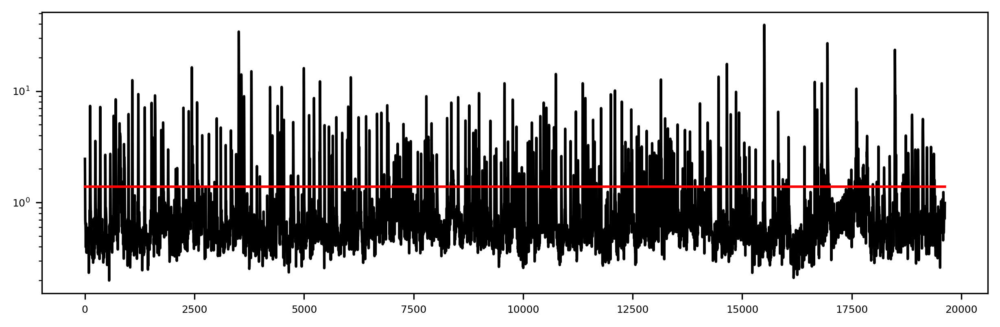

In [16]:
plt.figure(figsize=(10, 3), dpi=300)
plt.plot(RMS, color='black', label='RSS')
plt.plot(null_RMS_threshold, color='red', label='95th percentile null')
plt.yscale('log')
#plt.xlim([0, 2500])

# Identifying events and clusters

In [17]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.stats import percentileofscore
import numpy as np
from statsmodels.stats.multitest import multipletests
from scipy.stats import zscore

Identifying events before FDR correction

In [18]:
events = state_matrix[:, RMS > null_RMS_threshold]
print(events.shape[1])

2382


In [19]:
p_values = []
for value in tqdm(RMS, file=sys.stdout):
    empirical_percentile = percentileofscore(null_RMS_values, value)
    p_values.append((100 - empirical_percentile) / 100)
p_values = np.array(p_values)

100%|████████████████████████████████████| 19624/19624 [00:35<00:00, 559.46it/s]


In [20]:
alpha = 0.05
adjusted_results = multipletests(p_values, alpha=alpha, method='fdr_bh')
adjusted_p_values = adjusted_results[1] 

After FDR-correction

In [21]:
plateaus = find_plateaus(adjusted_p_values < 0.05)

fish_ids = []
for i, ts in enumerate(rseries):
    fish_ids += [i] * ts.shape[1]
fish_ids = np.array(fish_ids)

new_plateaus = []
for p in plateaus:
    f = fish_ids[p > 0]
    if len(np.unique(f)) == 1:
        new_plateaus.append(p)
    else:
        plateau_vector = np.copy(p)
        plateau_vector[plateau_vector > 0] = f
        fish_in_plateau = np.unique(f)
        for fish in fish_in_plateau:
            new_plateaus.append(plateau_vector == fish)
plateaus = np.stack(new_plateaus, axis=0)

events = []
for p in plateaus:
    frames = state_matrix[:, p > 0]
    events.append(np.mean(frames, axis=1))
events = np.stack(events, axis=1)
print(events.shape[1])

243


In [22]:
def compute_coassignment_probability_kmeans(data, N_iters=250, k_min=2, k_max=30, threshold=False):
   
    k = np.linspace(k_min, k_max, N_iters, endpoint=True).astype('int')
    clusters = np.zeros((data.shape[0], N_iters))

    for i in tqdm(range(N_iters), file=sys.stdout):
        clustering = KMeans(n_clusters=k[i]).fit(data)
        clusters[:, i] =  clustering.labels_

    coassignment_matrix = compute_consensus_matrix_from_labels(clusters)

    if threshold:
        communities_null = shuffle_communities(clusters)
        coassignment_matrix_null = compute_consensus_matrix_from_labels(communities_null)
        coassignment_matrix -= np.mean(coassignment_matrix_null)
        coassignment_matrix[coassignment_matrix < 0] = 0

    return coassignment_matrix

In [23]:
embedding = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=30, random_state=420).fit_transform(events.T)

clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
clusterer.fit(embedding)
clusters = clusterer.labels_

cluster_centroids = []
for c in np.unique(clusters):
    if c != -1:
        centroid = np.mean(events[:, clusters == c], axis=1)
        cluster_centroids.append(centroid)

for i, c in enumerate(clusters):
    if c == -1:
        event = events[:, i]
        similarity = []
        for centroid in cluster_centroids:
            r = pearsonr(event, centroid)[0]
            similarity.append(r)
        clusters[i] = np.argmax(similarity)

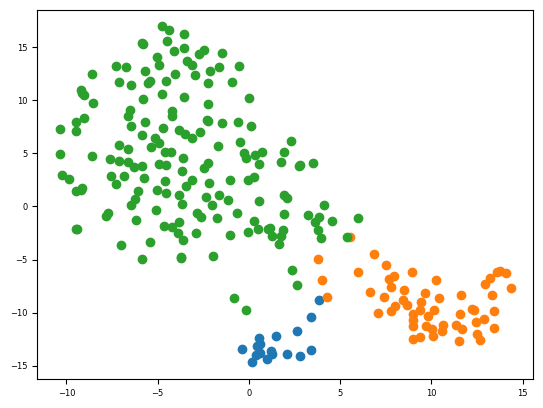

In [24]:
for c in np.unique(clusters):
    plt.scatter(embedding[clusters == c, 0], embedding[clusters == c, 1])

In [25]:
correlations = compute_correlation_matrix(events.T)

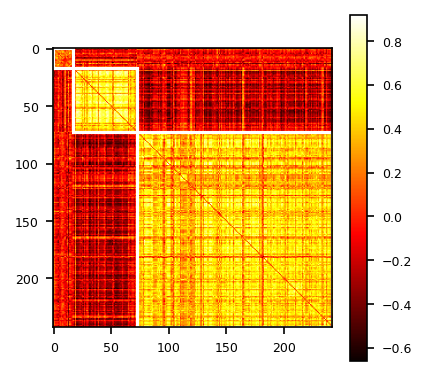

In [26]:
fig, ax = plt.subplots(figsize=(3, 3), dpi=150)
im = plot_matrix_communities(ax, correlations, clusters, linewidth=1.5, cmap='hot', edgecolor='white', output=True)
plt.colorbar(im, ax=ax)

clustering = KMeans(n_clusters=10).fit(events.T)
clusters =  clustering.labels_

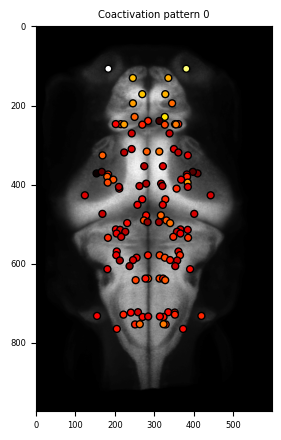

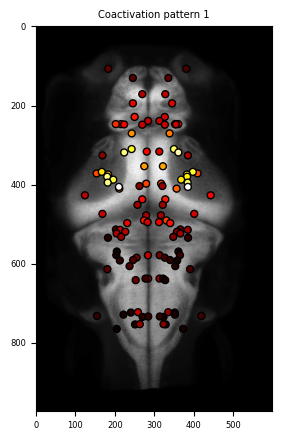

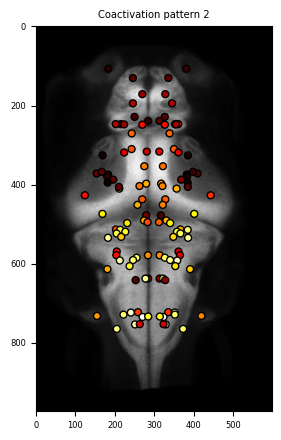

In [27]:
for i, cap in enumerate(cluster_centroids):
    fig, ax = plt.subplots(figsize=(5, 5))
    plot_node_values(ax, cap, atlas, excluded=excluded)
    plt.title(f'Coactivation pattern {i}')
    plt.show()

# Reordering coactivations by communities

In [28]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, ward, leaves_list, set_link_color_palette
from brainsmash.mapgen.base import Base

def plot_surrogates(activation, distances, communities, n=10, resample=True):
    base = Base(x=activation, D=distances, resample=resample)
    surrogates = base(n=n)
    R = len(activation)
    cap = activation.reshape(R, 1) @ activation.reshape(1, R)
    surrogate_caps = []
    for s in surrogates:
        surrogate_caps.append(s.reshape(R, 1) @ s.reshape(1, R))

    fig, ax = plt.subplots(3, 5, figsize=(10, 7))
    v = np.percentile(np.abs(cap), 95)

    plot_matrix_communities(ax[0, 2], cap, communities, vmin=-v, vmax=v)
    for i, s in enumerate(surrogate_caps):
        a = ax.flatten()[i + 5]
        v = np.percentile(np.abs(s), 95)
        plot_matrix_communities(a, s, communities, vmin=-v, vmax=v)
    for i, a in enumerate(ax.flatten()):
        if i in [0, 1, 3, 4]:
            a.axis('off')
        else:
            a.set_xticks([])
            a.set_yticks([])
    plt.show()

def compute_mean_coactivation_per_module(vector, communities):
    V = vector.flatten()
    N = len(vector)
    matrix = V.reshape(N, 1) @ V.reshape(1, N)
    ids = np.argsort(communities)
    reordered_matrix = matrix[ids, :][:, ids]
    reordered_communities = communities[ids]
    mean_coactivation_per_module = []
    for c in np.unique(communities):
        block = reordered_matrix[reordered_communities == c, :][:, reordered_communities == c]
        mean_coactivation_per_module.append(np.mean(block))
    return mean_coactivation_per_module

def compute_mean_coactivation_per_module_null(vector, distances, communities, n_surrogates=100, resample=True):
    V = vector.flatten()
    base = Base(x=vector, D=distances, resample=resample)
    surrogates = base(n=n_surrogates)
    ids = np.argsort(communities)
    means_surrogates = []
    for s in surrogates:
        N = len(s)
        matrix = s.reshape(N, 1) @ s.reshape(1, N)
        reordered_matrix, reordered_communities = matrix[ids, :][:, ids], communities[ids]
        mean_coactivation_per_module = []
        for c in np.unique(communities):
            block = reordered_matrix[reordered_communities == c, :][:, reordered_communities == c]
            mean_coactivation_per_module.append(np.mean(block))
        means_surrogates.append(mean_coactivation_per_module)
    return np.stack(means_surrogates)

def get_coactivation(activity_vector, normalize=False):
    N = len(activity_vector)
    if normalize:
        activity_vector -= np.min(activity_vector)
        activity_vector /= np.max(activity_vector)
    cap = activity_vector.reshape(N, 1) @ activity_vector.reshape(1, N)
    return cap

def plot_significant_modules(coactivation_pattern, significant, communities, edgecolor='white'):
    R = coactivation_pattern.shape[0]
    if len(coactivation_pattern.shape) == 1:
        coactivation_pattern = coactivation_pattern.reshape(R, 1) @ coactivation_pattern.reshape(1, R)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    v = np.percentile(np.abs(coactivation_pattern), 95)
    plot_matrix_communities(ax[0], coactivation_pattern, communities, vmin=-v, vmax=v)
    significant_modules1 = np.zeros(coactivation_pattern.shape)
    significant_modules2 = np.zeros(coactivation_pattern.shape)

    for i, s in enumerate(significant):
        if s:
            significant_modules1[communities == i + 1, :] = 1
            significant_modules2[:, communities == i + 1] = 1
    plot_matrix_communities(ax[1], significant_modules1 * significant_modules2, communities, vmin=0, vmax=1, cmap='gray', edgecolor=edgecolor)
    plt.show()

In [29]:
centroids = np.delete(centroids, excluded, axis=0)
distances = compute_distances(centroids)

In [30]:
coassignment_matrix_SC = np.load('Results/coassignment_matrix_optimized_SC.npy')

In [31]:
Z = linkage(1 - coassignment_matrix_SC, 'average')
ids_Z = np.flip(leaves_list(Z)).astype('int')
communities = reorder_clusters_anteroposterior(fcluster(Z, t=4, criterion='maxclust'))
communities = np.delete(double(communities), excluded)

In [36]:
mean_coactivations = []
mean_coactivations_null = []

for c in tqdm(cluster_centroids, file=sys.stdout):
    
    mean = compute_mean_coactivation_per_module(c, communities)
    mean_null = compute_mean_coactivation_per_module_null(c, distances, communities, n_surrogates=250)
    
    mean_coactivations.append(mean)
    mean_coactivations_null.append(mean_null)

100%|█████████████████████████████████████████████| 3/3 [00:51<00:00, 17.26s/it]


In [37]:
empirical = np.array(mean_coactivations)
null = np.percentile(np.array(mean_coactivations_null), 99, axis=1)

In [38]:
significant = empirical > null

In [39]:
def plot_significant_modules(coactivation_pattern, significant, communities, edgecolor='white'):
    R = coactivation_pattern.shape[0]
    if len(coactivation_pattern.shape) == 1:
        coactivation_pattern = coactivation_pattern.reshape(R, 1) @ coactivation_pattern.reshape(1, R)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    v = np.percentile(np.abs(coactivation_pattern), 95)
    plot_matrix_communities(ax[0], coactivation_pattern, communities, vmin=-v, vmax=v)
    significant_modules1 = np.zeros(coactivation_pattern.shape)
    significant_modules2 = np.zeros(coactivation_pattern.shape)

    for i, s in enumerate(significant):
        if s:
            significant_modules1[communities == i + 1, :] = 1
            significant_modules2[:, communities == i + 1] = 1
    plot_matrix_communities(ax[1], significant_modules1 * significant_modules2, communities, vmin=0, vmax=1, cmap='gray', edgecolor=edgecolor)
    plt.show()

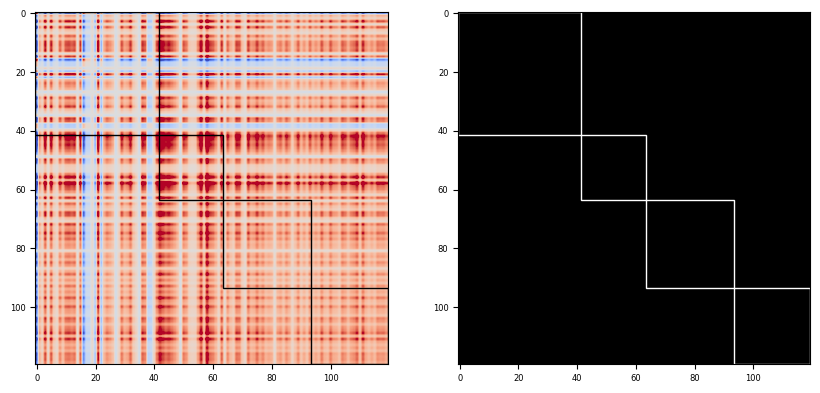

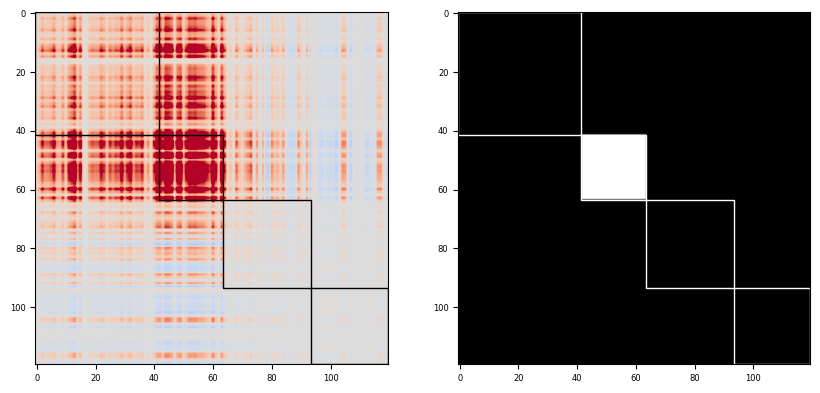

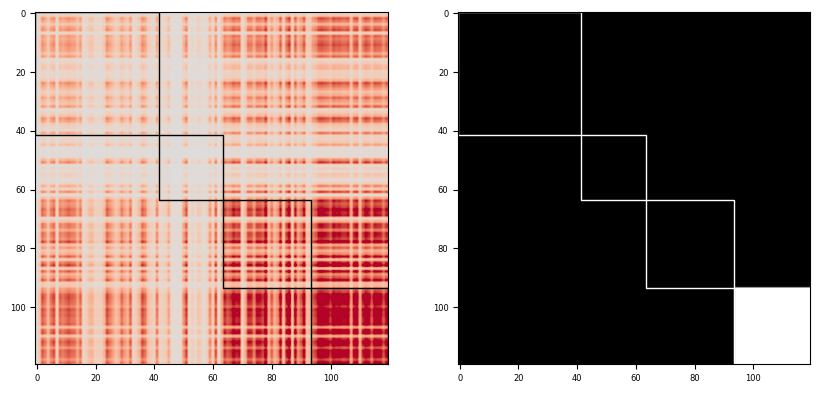

In [40]:
for i in range(len(cluster_centroids)):
    plot_significant_modules(cluster_centroids[i], significant[i], communities, edgecolor='white')

# Rendering coactivation patterns

In [32]:
from calimba.analysis.data import *

In [33]:
import numpy as np
from scipy.ndimage import convolve
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import cv2

def sigmoid(x, k=3, r0=2):
    """Sigmoid function for the transition."""
    return 1 - (1 / (1 + np.exp(-k * (x - r0))))

def sigmoidal_kernel(size, r0=2, k=3):
    """Create a 3D kernel with a spherical sigmoid transition."""
    z, y, x = np.indices((size, size, size))
    center = size // 2
    distances = np.sqrt((x - center)**2 + (y - center)**2 + (z - center)**2)
    kernel = sigmoid(distances, k=k, r0=r0)
    kernel /= np.sum(kernel)
    return kernel

def filter_timeseries(timeseries, sigma=2):
    filtered = np.zeros(timeseries.shape)
    for i in range(timeseries.shape[0]):
        filtered[i] = gaussian_filter1d(timeseries[i], sigma)
    return filtered

In [34]:
def get_registration_folders(top_directory, keywords=['Wholebrain']):
    piezo_reg_folders, stack_reg_folders = [], []
    folders = identify_folders(top_directory, keywords=keywords)
    for folder in folders:
        piezo_folder = identify_folders(folder, ['Registration-Piezo'])[0]
        piezo_reg_folders += identify_folders(piezo_folder, ['fish'])
        stack_folder = identify_folders(folder, ['Registration-Atlas'])[0]
        stack_reg_folders += identify_folders(stack_folder, ['fish'])
    return piezo_reg_folders, stack_reg_folders

In [35]:
reg_piezo_folders, reg_stack_folders = get_registration_folders(top_directory)

In [36]:
path_ANTs = '/home/anleg84/Documents/ANTs/bin/'
os.environ["PATH"] += os.pathsep + path_ANTs

In [37]:
cluster_paths = []
for c in np.unique(clusters):
    cluster_paths.append(top_directory + 'Clusters-Mapzebrain/ClusterHigh{}/'.format(c + 1))

In [38]:
cluster_plateaus = np.copy(plateaus).astype('int')
for i, c in enumerate(clusters):
    cluster_plateaus[i][cluster_plateaus[i] > 0] = c + 1
#np.save('Results/figure4_cluster_plateaus.npy', cluster_plateaus)

In [39]:
for c in np.unique(clusters)[1:2]:

    frame_vector = np.sum(cluster_plateaus[clusters == c], axis=0) > 0
    
    for fish in tqdm(np.unique(fish_ids), file=sys.stdout):
        
        directory = cluster_paths[c]
        nrrd_header = load_stack(reg_piezo_folders[fish] + 'piezo.nrrd')[1]
    
        frame_ids = np.where(frame_vector[fish_ids == fish])[0]
        if np.any(frame_ids):
            folder = datasets[fish]
            file = identify_files(folder, ['piezo', '.nrrd'])[0]
            piezo_stack = load_stack(folder + file)[0].astype('float')
            volumes = load_volumes(folder, frame_ids, keywords=['dff_corrected_', '.tif'], exclude=[])
            
        save_stack(directory + 'fish{}.nrrd'.format(fish), np.mean(volumes, axis=0), nrrd_header)
        
        os.chdir(directory)
        
        file_in = 'fish{}.nrrd'.format(fish)
        file_out = 'fish{}_stack.nrrd'.format(fish)
        path_to_transforms = reg_piezo_folders[fish]
        path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
        
        os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}stack.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                        file_in, file_out, path_to_transforms))
        
        file_in = 'fish{}_stack.nrrd'.format(fish)
        file_out = 'fish{}_atlas.nrrd'.format(fish) 
        path_to_transforms = reg_stack_folders[fish]
        path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
        
        os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}atlas.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                        file_in, file_out, path_to_transforms))
        
        os.remove(directory + 'fish{}.nrrd'.format(fish))
        os.remove(directory + 'fish{}_stack.nrrd'.format(fish))

100%|███████████████████████████████████████████| 22/22 [17:47<00:00, 48.53s/it]


centroid_frames = []
for c in np.unique(clusters):
    frame_vector = np.sum(cluster_plateaus[clusters == c], axis=0) > 0
    frames = []
    for fish in tqdm(np.unique(fish_ids), file=sys.stdout):
        frame_ids = np.where(frame_vector[fish_ids == fish])[0]
        if np.any(frame_ids):
            folder = datasets[fish]
            file = identify_files(folder, ['piezo', '.nrrd'])[0]
            piezo_stack = load_stack(folder + file)[0].astype('float')
            volumes = load_volumes(folder, frame_ids, keywords=['corrected_', '.tif'])
            volumes_mean = np.tile(np.expand_dims(piezo_stack, axis=0), (volumes.shape[0], 1, 1, 1))
            subtracted = volumes - volumes_mean        
        frame = np.mean(subtracted, axis=(0, 1))
        frames.append(frame)
    stack = np.stack(frames, axis=0)
    centroid_frames.append(np.mean(stack, axis=0))

In [41]:
shape = (180, 974, 597)

100%|███████████████████████████████████████████| 22/22 [01:55<00:00,  5.24s/it]


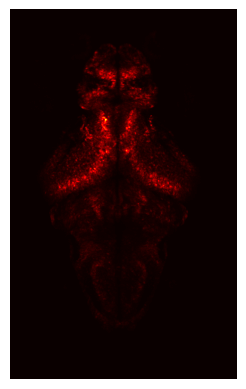

In [42]:
for c in np.unique(clusters):
    if c == 1:

        directory = cluster_paths[c]
        files = identify_files(directory, ['atlas', '.nrrd'])
        stack = np.zeros(shape).astype('float')
        for i in tqdm(range(len(files)), file=sys.stdout):
            new_stack, header = load_stack(directory + files[i])
            stack = (i / (i + 1)) * stack + (1 / (i + 1)) * new_stack.astype('float') # Running average
        
        save_stack(directory + 'average.nrrd', stack, header)
        
        plt.imshow(np.max(stack ** 3, axis=0), cmap='hot')
        plt.axis('off')
        plt.show()

# Studying smaller amplitude patterns

In [41]:
def get_size_MB(object):
    return sys.getsizeof(object) / 1e6

In [42]:
trim_frames = np.zeros((len(fish_ids), ))
for f in np.unique(fish_ids):
    vec = trim_frames[fish_ids == f]
    vec[:60] = 1
    vec[630:] = 1
    trim_frames[fish_ids == f] = vec

large_amplitude_frames = np.sum(plateaus, axis=0)

excluded_frames = np.where((trim_frames + large_amplitude_frames) > 0)[0]

state_matrix_low = np.delete(state_matrix, excluded_frames, axis=1)
fish_ids_low = np.delete(fish_ids, excluded_frames)

In [43]:
fish_ids_frames = []
for fish in np.unique(fish_ids):
    vec = fish_ids[fish_ids == fish]
    fish_ids_frames.append(np.arange(len(vec)))
fish_ids_frames = np.concatenate(fish_ids_frames)

fish_ids_frames_low = np.delete(fish_ids_frames, excluded_frames)

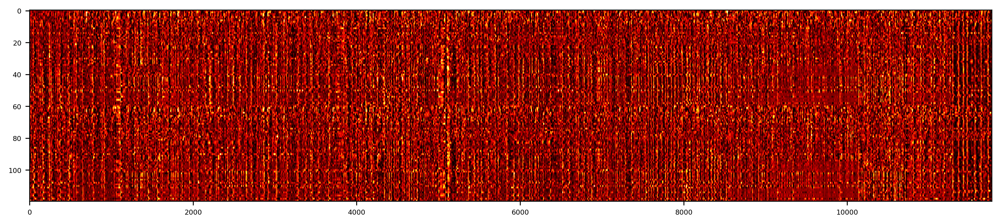

In [44]:
plt.figure(figsize=(15, 3), dpi=300)
plt.imshow(state_matrix_low, cmap='hot', aspect='auto', vmin=-1, vmax=3)

In [45]:
def compute_coassignment_probability_kmeans(data, N_iters=1000, k_min=2, k_max=30, threshold=False):
   
    k = np.linspace(k_min, k_max, N_iters, endpoint=True).astype('int')
    clusters = np.zeros((data.shape[0], N_iters))

    for i in tqdm(range(N_iters), file=sys.stdout):
        clustering = KMeans(n_clusters=k[i]).fit(data)
        clusters[:, i] =  clustering.labels_

    coassignment_matrix = compute_consensus_matrix_from_labels(clusters)

    if threshold:
        communities_null = shuffle_communities(clusters)
        coassignment_matrix_null = compute_consensus_matrix_from_labels(communities_null)
        coassignment_matrix -= np.mean(coassignment_matrix_null)
        coassignment_matrix[coassignment_matrix < 0] = 0

    return coassignment_matrix

In [46]:
compute = False
if compute:
    consensus = compute_coassignment_probability_kmeans(state_matrix_low.T, k_max=30, N_iters=500)
    np.save('Results/figure4_low_amplitude_consensus.npy', consensus)
else:
    consensus = np.load('Results/figure4_low_amplitude_consensus.npy')

In [47]:
compute = False
if compute:
    Z = linkage(1 - consensus, 'ward')
    save_with_pickle('Results/figure4_low_amplitude_dendrogram.npy', Z)
else:
    Z = load_with_pickle('Results/figure4_low_amplitude_dendrogram.npy')

In [48]:
N_clusters = np.arange(2, 31)

compute = False
if compute:
    silhouette_scores = []
    for t in tqdm(N_clusters, file=sys.stdout):
        clusters = reorder_clusters_anteroposterior(fcluster(Z, t=t, criterion='maxclust'))
        s = silhouette_score(consensus, clusters)
        silhouette_scores.append(s)
    np.save('Results/figure4_silhouette_scores.npy', silhouette_scores)
else:
    silhouette_scores = np.load('Results/figure4_silhouette_scores.npy')

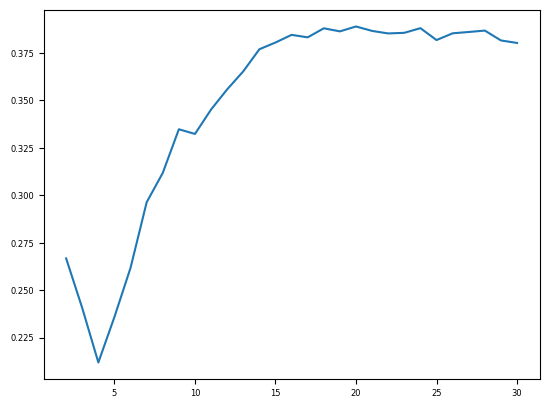

In [49]:
plt.plot(N_clusters, silhouette_scores)

In [50]:
N_opt = N_clusters[np.argmax(silhouette_scores)]
print(N_opt)

20


In [51]:
clusters = fcluster(Z, t=N_opt, criterion='maxclust')

In [52]:
clusters_vector_low = np.ones((state_matrix.shape[1], )) * -1
excluded_vector = np.zeros((state_matrix.shape[1], ))
excluded_vector[excluded_frames] = 1
clusters_vector_low[np.logical_not(excluded_vector)] = clusters

In [53]:
np.save('Results/figure4_clusters_vector_low_amplitude.npy', clusters_vector_low)

In [136]:
def compute_clusters_cohesion(matrix, clusters):
    cohesions = []
    for c in np.unique(clusters):
        block = matrix[clusters == c, :][:, clusters == c]
        triangle = np.triu_indices(block.shape[0], 1)
        cohesions.append(np.mean(block[triangle]))
    return cohesions

def compute_intercluster_cohesion(matrix, clusters):
    cohesions = []
    for c1 in np.unique(clusters):
        for c2 in np.unique(clusters):
            if c1 != c2:
                block = matrix[clusters == c1, :][:, clusters == c2]
                cohesions.append(block.flatten())
    return np.concatenate(cohesions)

In [129]:
cohesions = compute_clusters_cohesion(consensus, clusters)

In [130]:
def reorder_clusters_by_criterion(clusters, criterion):
    new_clusters = np.copy(clusters)
    order = np.flip(np.argsort(criterion))
    for i, c in enumerate(order):
        new_clusters[clusters == c] = i
    return new_clusters

In [131]:
reordered_clusters = reorder_clusters_by_criterion(clusters - 1, cohesions)

In [132]:
cohesions = compute_clusters_cohesion(consensus, reordered_clusters)

In [137]:
intercluster_cohesions = compute_intercluster_cohesion(consensus, reordered_clusters)

In [145]:
perc = np.percentile(intercluster_cohesions, 99b)

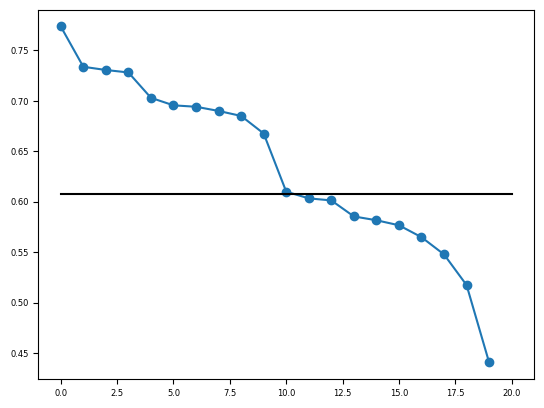

In [146]:
plt.plot(np.arange(len(cohesions)), cohesions)
plt.scatter(np.arange(len(cohesions)), cohesions)
plt.plot([0, 20], [perc, perc], color='black')

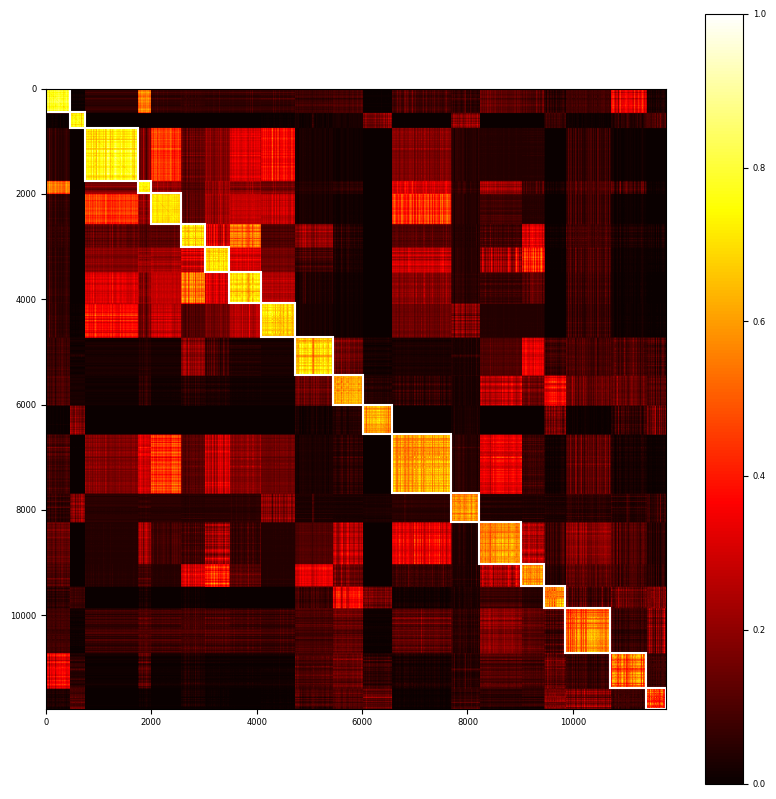

In [59]:
fig, ax = plt.subplots(figsize=(10, 10))
im = plot_matrix_communities(ax, consensus, reordered_clusters, linewidth=1.5, cmap='hot', edgecolor='white', output=True)
plt.colorbar(im, ax=ax)

In [60]:
cluster_centroids = []
for c in np.unique(clusters):
    if c != -1:
        centroid = np.mean(state_matrix_low[:, clusters == c], axis=1)
        cluster_centroids.append(centroid)

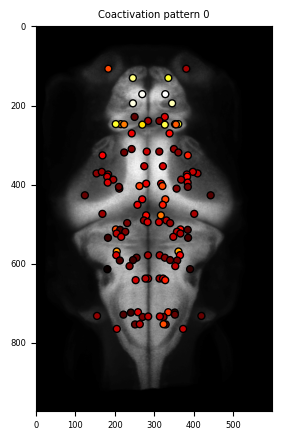

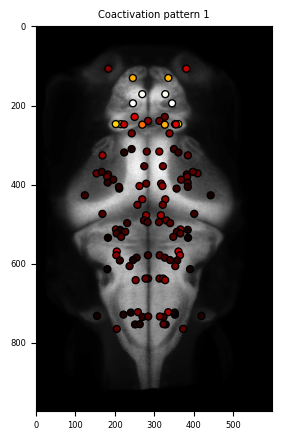

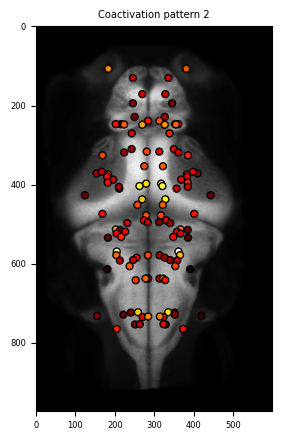

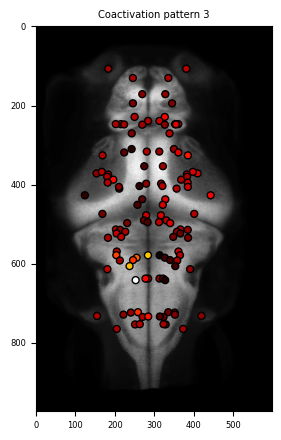

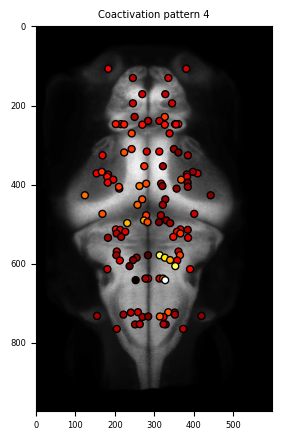

...

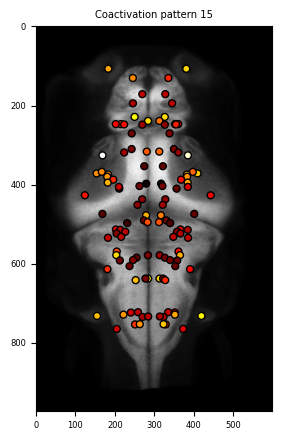

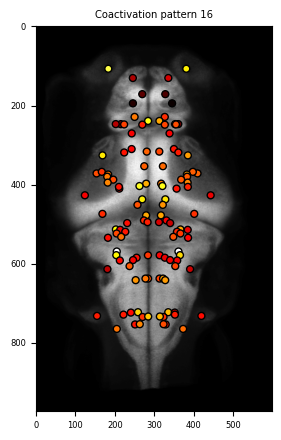

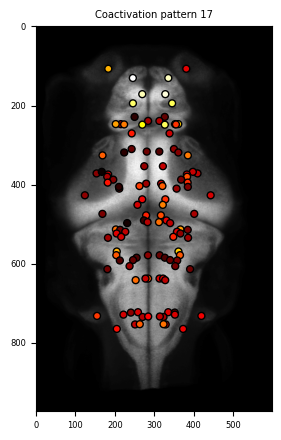

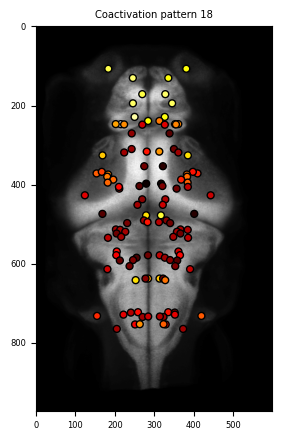

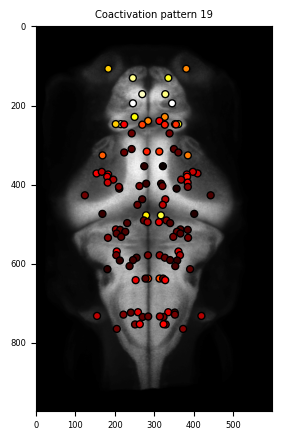

In [61]:
for i, cap in enumerate(cluster_centroids):
    fig, ax = plt.subplots(figsize=(5, 5))
    plot_node_values(ax, cap, atlas, excluded=excluded)
    plt.title(f'Coactivation pattern {i}')
    plt.show()

In [62]:
normalized_centroids = []
for c in cluster_centroids:
    v = np.copy(c)
    v -= np.min(v)
    v /= np.max(v)
    normalized_centroids.append(v)

plt.imshow(get_coactivation(cluster_centroids[0], normalize=True), cmap='magma')

In [63]:
Z = linkage(1 - coassignment_matrix_SC, 'average')
ids_Z = np.flip(leaves_list(Z)).astype('int')
communities = reorder_clusters_anteroposterior(fcluster(Z, t=4, criterion='maxclust'))
communities = np.delete(double(communities), excluded)

In [60]:
mean_coactivations = []
mean_coactivations_null = []

for c in tqdm(normalized_centroids, file=sys.stdout):
    
    mean = compute_mean_coactivation_per_module(c, communities)
    mean_null = compute_mean_coactivation_per_module_null(c, distances, communities, n_surrogates=200)
    
    mean_coactivations.append(mean)
    mean_coactivations_null.append(mean_null)

100%|███████████████████████████████████████████| 20/20 [02:37<00:00,  7.88s/it]


In [61]:
empirical = np.array(mean_coactivations)
null = np.percentile(np.array(mean_coactivations_null), 95, axis=1)
significant = empirical > null

Cluster 0


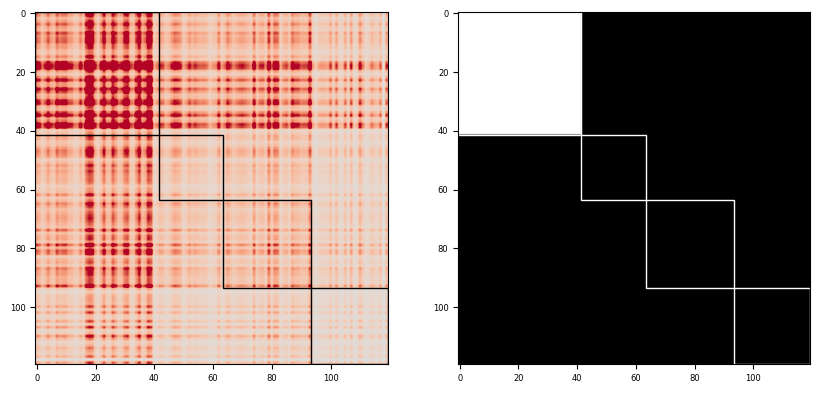

Cluster 1


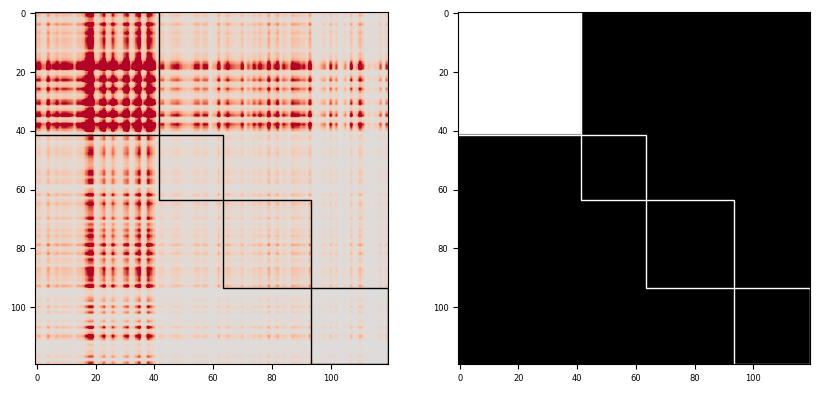

Cluster 2


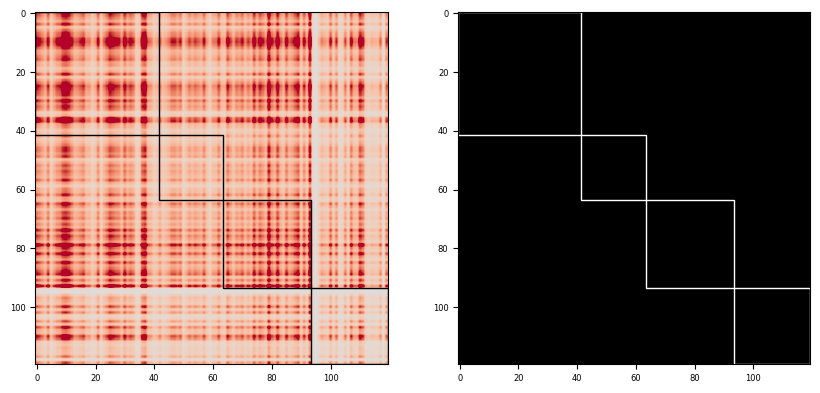

Cluster 3


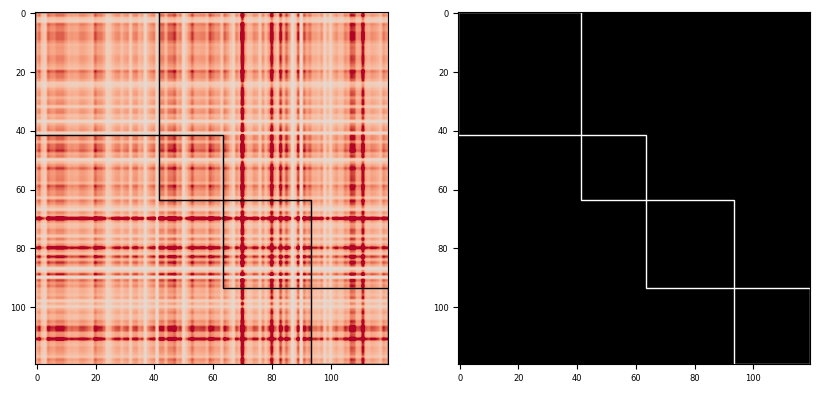

Cluster 4


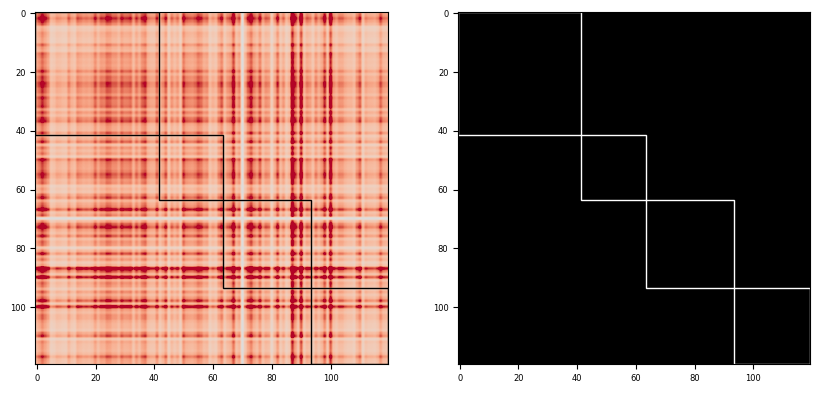

Cluster 5


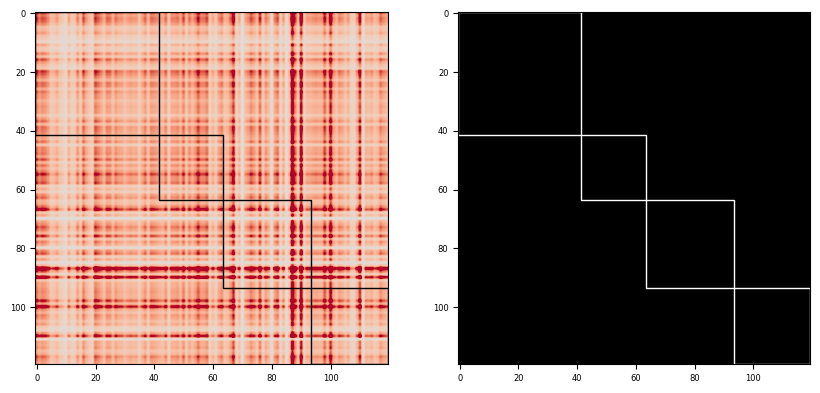

Cluster 6


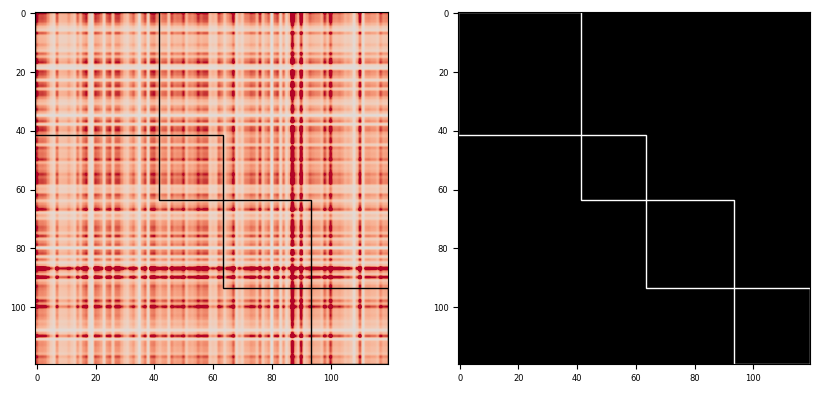

Cluster 7


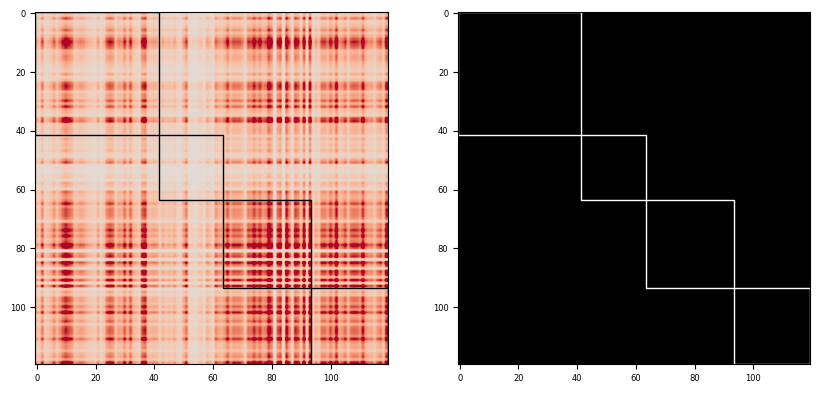

Cluster 8


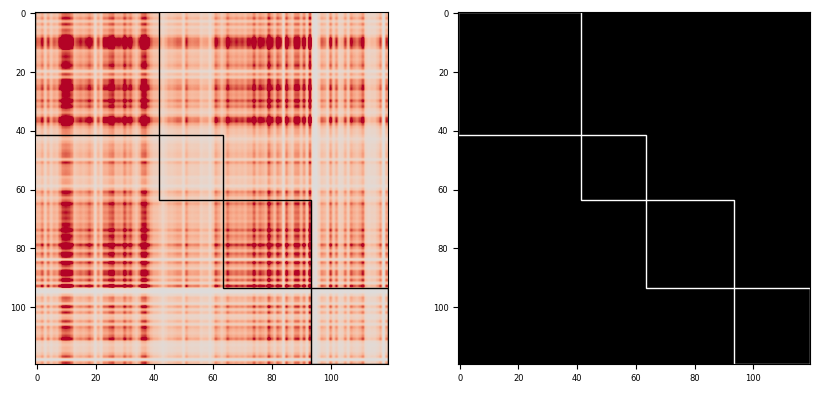

Cluster 9


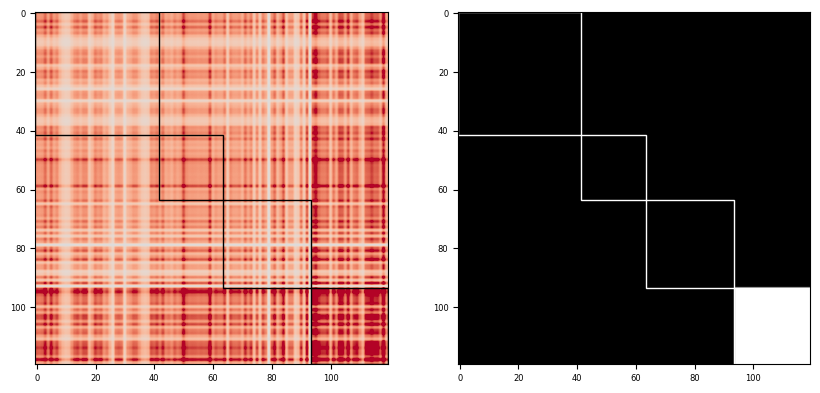

Cluster 10


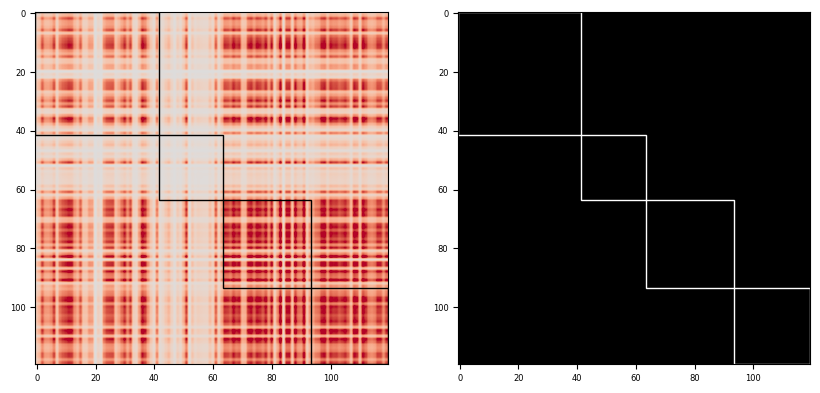

Cluster 11


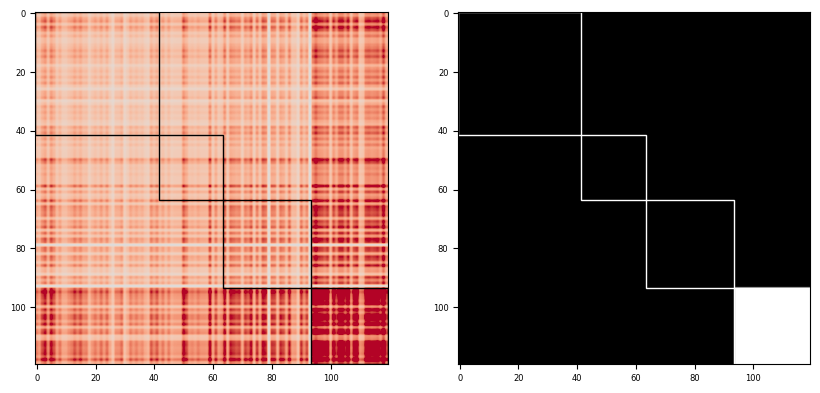

Cluster 12


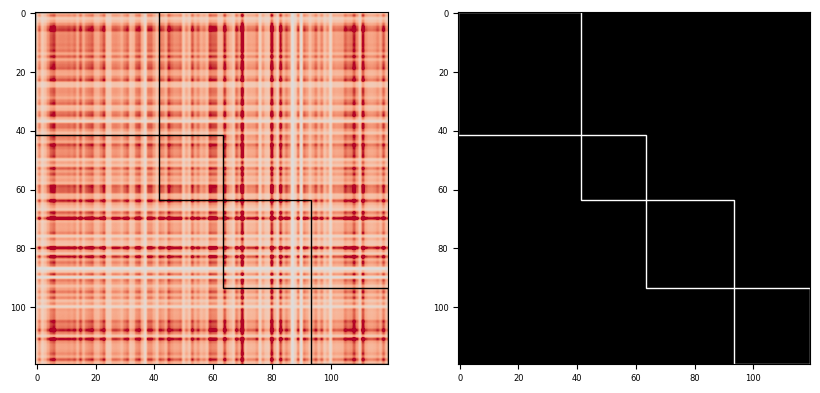

Cluster 13


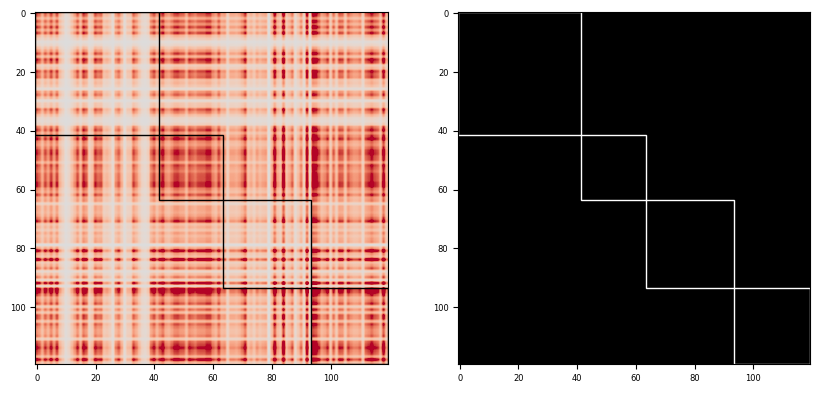

Cluster 14


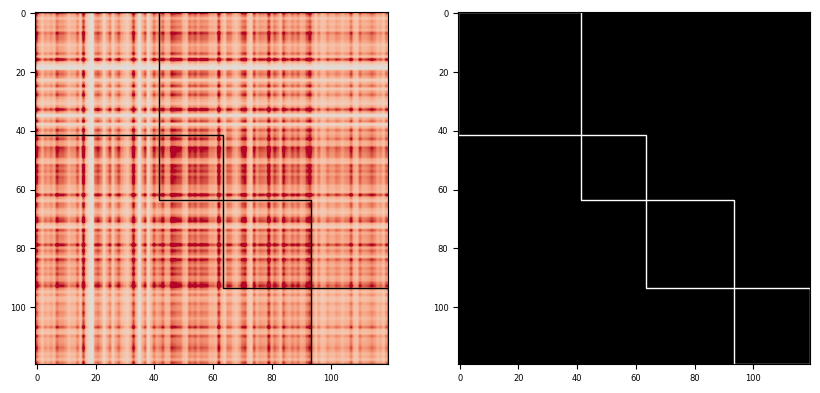

Cluster 15


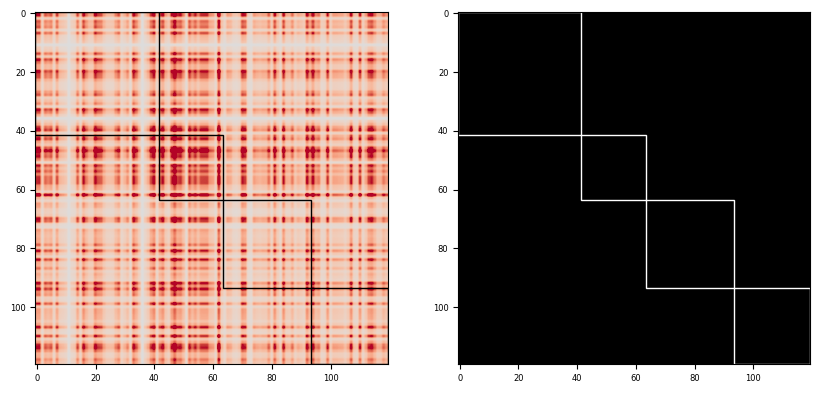

Cluster 16


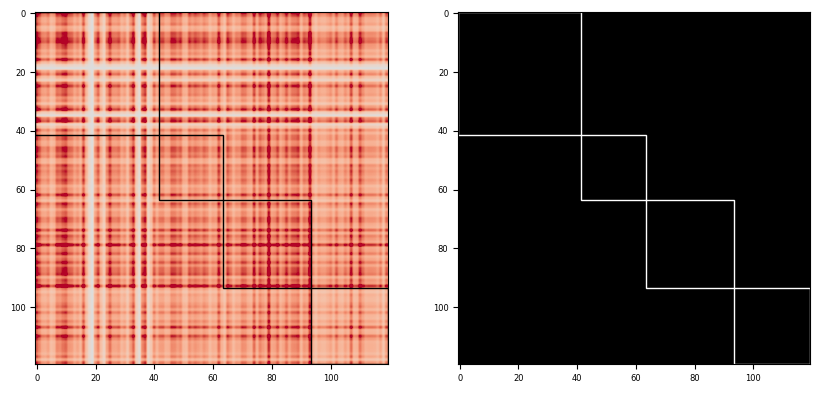

Cluster 17


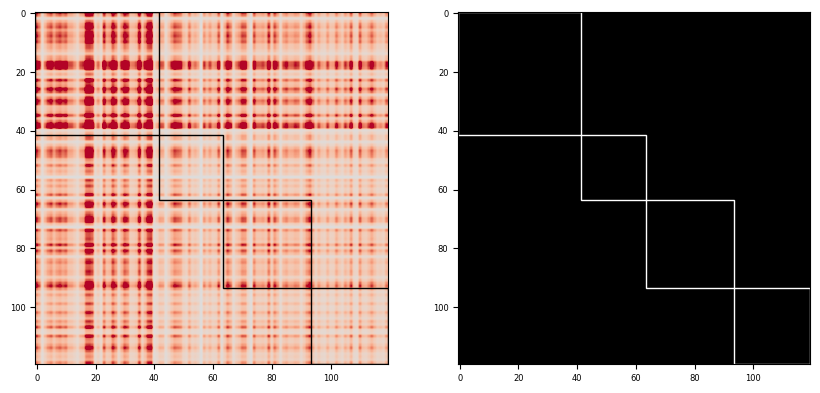

Cluster 18


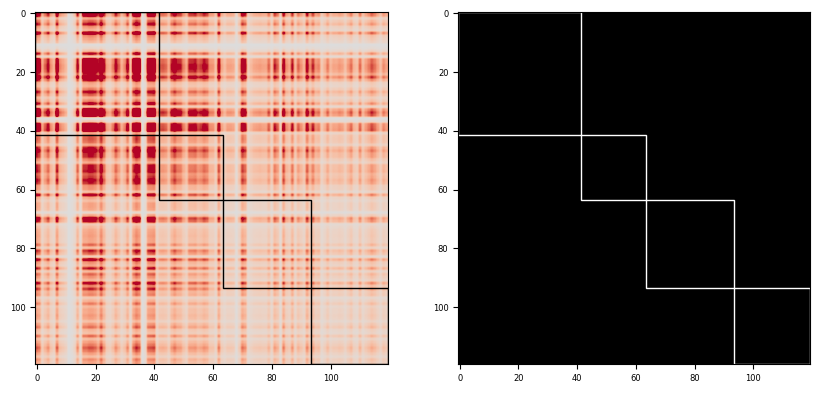

Cluster 19


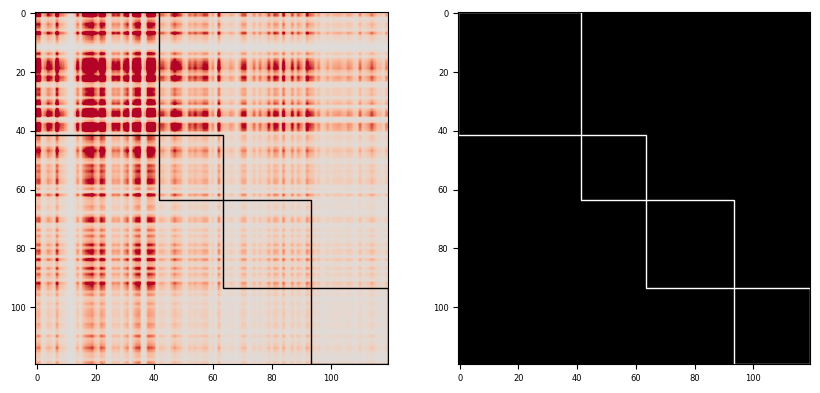

In [62]:
for i in range(len(cluster_centroids)):
    print('Cluster {}'.format(i))
    plot_significant_modules(normalized_centroids[i] , significant[i], communities, edgecolor='white')

# Rendering low-amplitude activation cluster centroids

In [64]:
from calimba.analysis.data import *

In [65]:
cluster_paths = []
for c in np.unique(clusters):
    cluster_paths.append(top_directory + 'Clusters-Mapzebrain/Cluster{}/'.format(c))

In [66]:
def get_registration_folders(top_directory, keywords=['Wholebrain']):
    piezo_reg_folders, stack_reg_folders = [], []
    folders = identify_folders(top_directory, keywords=keywords)
    for folder in folders:
        piezo_folder = identify_folders(folder, ['Registration-Piezo'])[0]
        piezo_reg_folders += identify_folders(piezo_folder, ['fish'])
        stack_folder = identify_folders(folder, ['Registration-Atlas'])[0]
        stack_reg_folders += identify_folders(stack_folder, ['fish'])
    return piezo_reg_folders, stack_reg_folders

In [67]:
reg_piezo_folders, reg_stack_folders = get_registration_folders(top_directory)

In [68]:
path_ANTs = '/home/anleg84/Documents/ANTs/bin/'
os.environ["PATH"] += os.pathsep + path_ANTs

In [ ]:
for c in np.unique(clusters):

    if c > 1:
    
        for fish in tqdm(np.unique(fish_ids), file=sys.stdout):
        
            #print('Fish {}'.format(fish))
            directory = cluster_paths[c - 1]
            nrrd_header = load_stack(reg_piezo_folders[fish] + 'piezo.nrrd')[1]
        
            #print('Loading volumes...')
            frame_ids = fish_ids_frames[fish_ids == fish][clusters_vector_low[fish_ids == fish] == c]
            if np.any(frame_ids):
                folder = datasets[fish]
                file = identify_files(folder, ['piezo', '.nrrd'])[0]
                piezo_stack = load_stack(folder + file)[0].astype('float')
                volumes = load_volumes(folder, frame_ids, keywords=['dff_corrected_', '.tif'], exclude=[])
                
            save_stack(directory + 'fish{}.nrrd'.format(fish), np.mean(volumes, axis=0), nrrd_header)
            
            os.chdir(directory)
        
            #print('Transforming into brain atlas...')
        
            file_in = 'fish{}.nrrd'.format(fish)
            file_out = 'fish{}_stack.nrrd'.format(fish)
            path_to_transforms = reg_piezo_folders[fish]
            path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
            
            os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}stack.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                            file_in, file_out, path_to_transforms))
            
            file_in = 'fish{}_stack.nrrd'.format(fish)
            file_out = 'fish{}_atlas.nrrd'.format(fish) 
            path_to_transforms = reg_stack_folders[fish]
            path_to_transforms = os.path.relpath(path_to_transforms, directory) + '/'
            
            os.system('antsApplyTransforms -d 3 --interpolation Linear -i {0} -o {1} -r {2}atlas.nrrd -t {2}1Warp.nii.gz -t {2}0GenericAffine.mat'.format(
                            file_in, file_out, path_to_transforms))
            
            os.remove(directory + 'fish{}.nrrd'.format(fish))
            os.remove(directory + 'fish{}_stack.nrrd'.format(fish))
        
            #print('Done!')

 95%|█████████████████████████████████████████  | 21/22 [17:15<00:48, 48.81s/it]

#### Generating averages

In [74]:
shape = (180, 974, 597)
c = 1

100%|███████████████████████████████████████████| 22/22 [01:11<00:00,  3.23s/it]


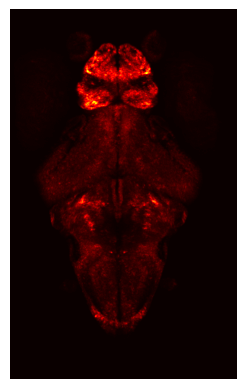

100%|███████████████████████████████████████████| 22/22 [02:37<00:00,  7.17s/it]


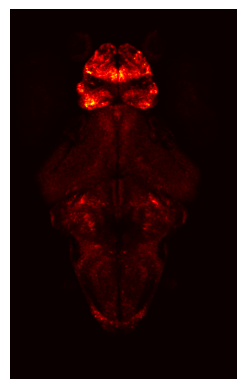

100%|███████████████████████████████████████████| 22/22 [02:53<00:00,  7.88s/it]


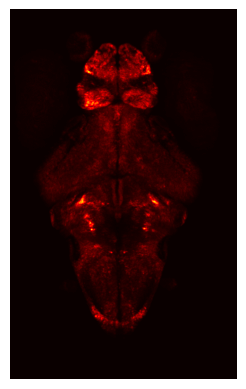

100%|███████████████████████████████████████████| 22/22 [02:42<00:00,  7.38s/it]


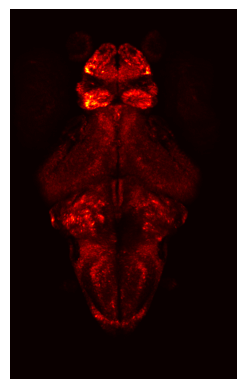

100%|███████████████████████████████████████████| 22/22 [02:43<00:00,  7.42s/it]


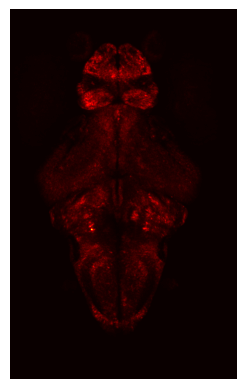

100%|███████████████████████████████████████████| 22/22 [02:41<00:00,  7.36s/it]


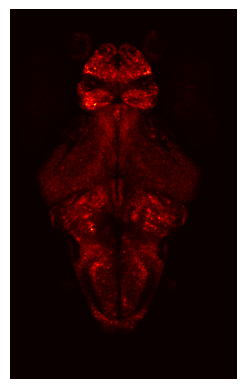

100%|███████████████████████████████████████████| 22/22 [02:40<00:00,  7.32s/it]


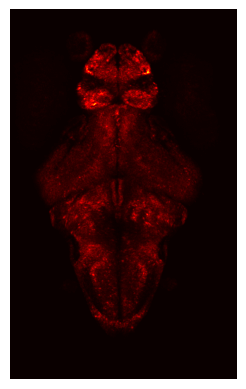

100%|███████████████████████████████████████████| 22/22 [02:43<00:00,  7.43s/it]


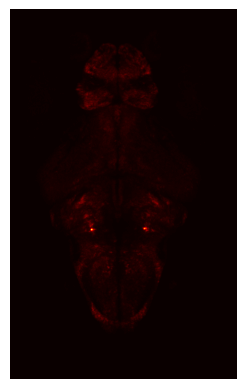

100%|███████████████████████████████████████████| 22/22 [02:49<00:00,  7.71s/it]


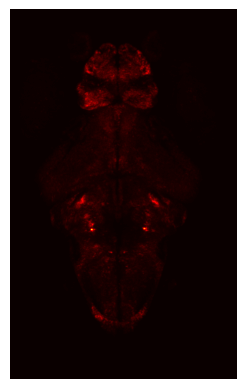

100%|███████████████████████████████████████████| 22/22 [02:50<00:00,  7.75s/it]


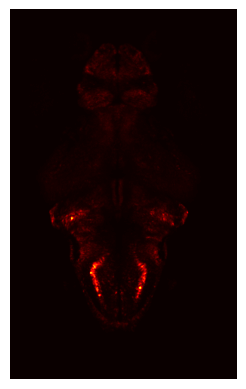

100%|███████████████████████████████████████████| 22/22 [02:53<00:00,  7.87s/it]


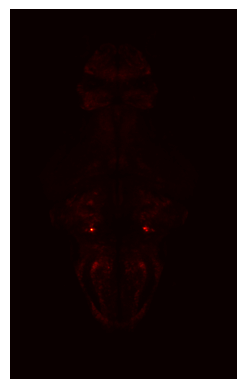

100%|███████████████████████████████████████████| 22/22 [02:54<00:00,  7.95s/it]


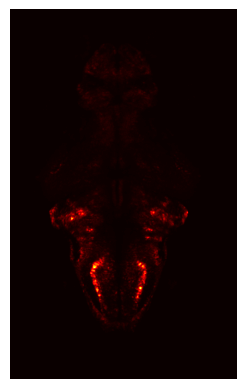

100%|███████████████████████████████████████████| 22/22 [02:53<00:00,  7.90s/it]


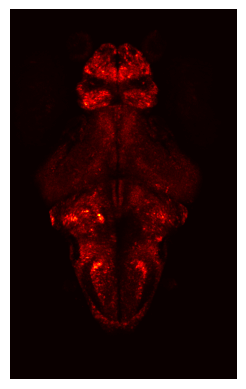

100%|███████████████████████████████████████████| 22/22 [02:54<00:00,  7.92s/it]


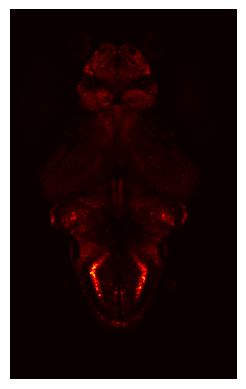

100%|███████████████████████████████████████████| 22/22 [02:54<00:00,  7.95s/it]


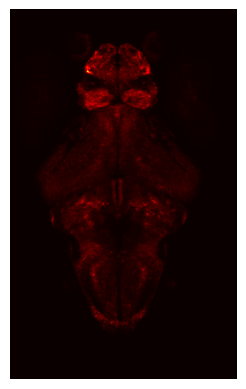

100%|███████████████████████████████████████████| 22/22 [02:58<00:00,  8.12s/it]


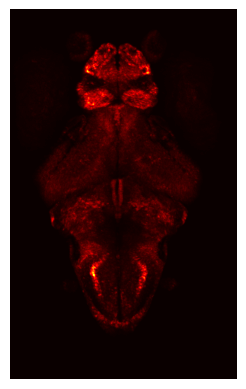

100%|███████████████████████████████████████████| 22/22 [02:57<00:00,  8.07s/it]


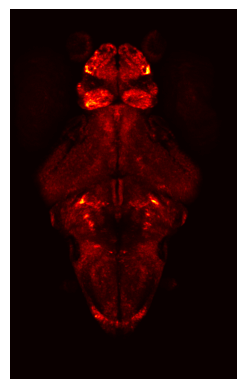

100%|███████████████████████████████████████████| 22/22 [03:02<00:00,  8.29s/it]


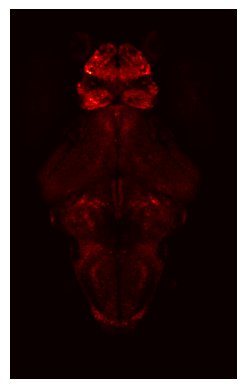

100%|███████████████████████████████████████████| 22/22 [03:07<00:00,  8.51s/it]


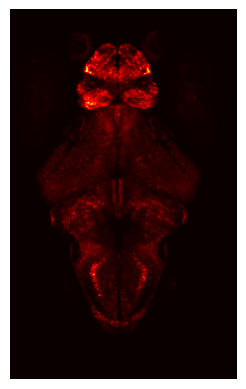

100%|███████████████████████████████████████████| 22/22 [03:09<00:00,  8.60s/it]


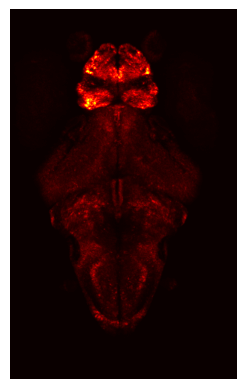

In [88]:
for c in np.unique(clusters):

    directory = cluster_paths[c - 1]
    files = identify_files(directory, ['atlas', '.nrrd'])
    stack = np.zeros(shape).astype('float')
    for i in tqdm(range(len(files)), file=sys.stdout):
        new_stack, header = load_stack(directory + files[i])
        stack = (i / (i + 1)) * stack + (1 / (i + 1)) * new_stack.astype('float') # Running average
    
    save_stack(directory + 'average.nrrd', stack, header)
    
    plt.imshow(np.max(stack ** 3, axis=0), cmap='hot')
    plt.axis('off')
    plt.show()

# Testing ICA

In [89]:
from sklearn.decomposition import FastICA

In [114]:
ICA = FastICA(n_components=6, whiten='unit-variance', max_iter=1000)
components = ICA.fit_transform(state_matrix).T

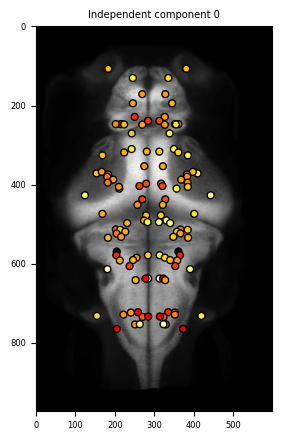

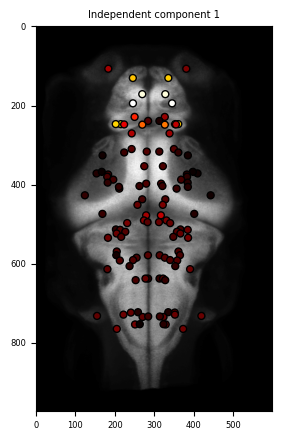

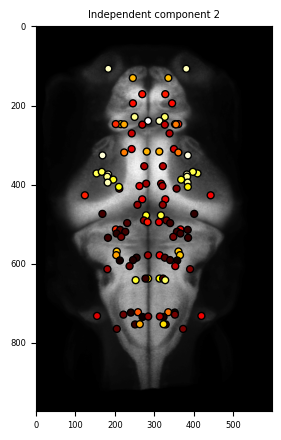

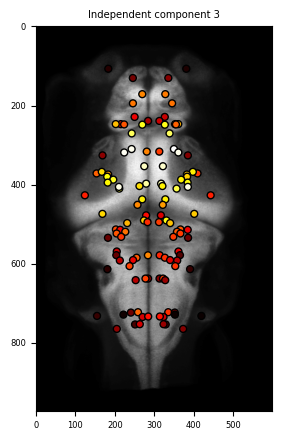

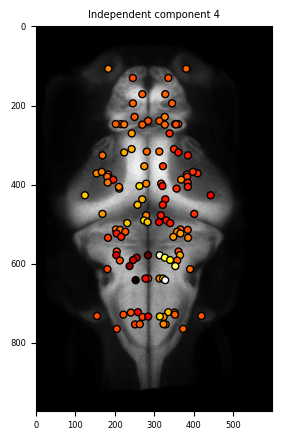

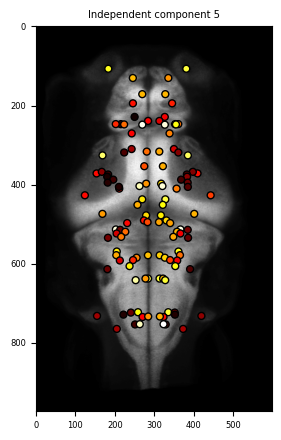

In [117]:
for i, c in enumerate(components):
    fig, ax = plt.subplots(figsize=(5, 5))
    plot_node_values(ax, -components[i], atlas, excluded=excluded, cmap='hot')
    plt.title(f'Independent component {i}')
    plt.show()